## DATA DESCRIPTION:
This dataset covers almost one hundred years of Encyclopaedia Britannica – the first eight editions of the text. The Britannica set the standard for modern encyclopedias and is sometimes seen as an enduring product of the Scottish Enlightenment. Published in Edinburgh, these volumes were a compendium of current and practical knowledge made relatively affordable for purchase.

The Britannica was first issued in Edinburgh in 100 weekly parts (forming 3 volumes) from 1768 to 1771 and illustrated with 160 copperplate engravings. Subsequent editions of the Britannica expanded the content: the second edition was published in 10 volumes (1777-1784); the third in 18 volumes (1788-1797). It offers exciting new opportunities to explore and trace the representation of knowledge over time.

- General type of the data: textual
- Size and complexity: 48.5GB whole floder / 195 subfloders / countless xmls (The Analyzed Layout and Text Object (ALTO) XML Schema), same amounts of pictures, plain text

## PLEASE CLICK THE "NOT TRUST" ON THE TOP RIGHT TO MAKE IT TO "TRUST" TO SEE GRAPHS###

In [2]:
import pandas as pd
import numpy as np
import glob
try:
  import xml.etree.cElementTree as et
except ImportError:
  import xml.etree.ElementTree as et
from nltk.corpus import words
from textblob import TextBlob
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.offline as offline
offline.init_notebook_mode(connected=True)
import networkx as nx
from wordcloud import WordCloud
%matplotlib inline
sns.set(font_scale=2, style = 'whitegrid')
print('-- Import Done --')

-- Import Done --


--------
### The following 4 blocks only work on my own laptop, no need to run

In [ ]:
#Generate file list for future use
for filename in glob.glob(r'**/*mets.xml', recursive=True):
    #Open xml files
    with open(filename,'r') as schema_file:
        doc = et.parse(schema_file)
    root = doc.getroot()
    print(filename)
    list = []
    #Get attributes from list
    for child in root.iter():
        a=dict(child.attrib)
        if (a.__contains__('LABEL')&a.__contains__('TYPE')) or a.__contains__('FILEID'):
            list.append(a)
    #Save it to dataframe
        attrib_list = pd.DataFrame(list)
    #Extract information 
    attrib_list_cleaned = attrib_list[(attrib_list['ID'].notna()) | (attrib_list['FILEID'].str.contains(r'\.34', na=False))]
    newindex = []
    index1 = []
    indexcolumns = ['ID', 'LABEL', 'TYPE', 'ORDER']
    for index, row in attrib_list_cleaned.iterrows():
        if str(row['ID']) != 'nan':
            row0 = row[indexcolumns]
            index1 = row.tolist()
        else:
            lis = row0.to_list()
            lis.append(row['FILEID'])
            newindex.append(lis)
    attrib_list_final = pd.DataFrame(newindex,columns=['ID', 'LABEL', 'TYPE', 'ORDER','FILEID']).set_index(indexcolumns)
    attrib_list_final.to_csv(filename+'.csv')

## Some Definitions & Structure of Data in this Project

`Mother Word` , `Related Word`    
See the example below ⬇️

In [ ]:
#################################################
#                                               #
#        ABACISCUS, or XXX, See ABACUS          #
#            ｜                    \             #
#            ｜                    \             #
#        Mother Word             Related Word   #
#                                               #
#                                               #
################################################

In [ ]:
#preparation for using xpath in xml
tagtext = '{http://www.loc.gov/standards/alto/v3/alto.xsd}'
path_TexLine = tagtext+'Layout/'+tagtext+'Page/'+tagtext+'PrintSpace/'+tagtext+'TextLine'
path_Relate_String = tagtext+'String'
path_String = tagtext+'Layout/'+tagtext+'Page/'+tagtext+'PrintSpace/'+tagtext+'TextLine/'+tagtext+'String'
relate_count = 0
#Manually cleaning
removelist = ['I.','II.','III.','IV.','V.','VI.','VII.','VIII.', 'IX.', 'X.','XI', 'TIT.','TIT,','TIT','PLATE','THUS,','OF','CHAP.','THE,','THE','VOL.','VOL,','PART','PARTI.','SOME','THEY','IT','INDEX,','INDEX.','INDEX']

#Edition Numbers
editionNumberFirst1771 = [144133901, 144133902, 144133903]
editionNumberFirst1773 = [144850366, 144850367, 144850368]
editionNumberSecond = [144850370, 144850373, 144850374, 144850375, 144850376, 144850377, 144850378, 144850379, 190273289, 190273290]
editionNumberThird1 = [190273291, 149977338, 149977873, 149978642, 149979156, 149979622, 149981189, 149981670, 149982181, 149982692, 149983206, 190273372, 191253798, 192200061, 191253799, 191319917, 191253800, 191253817]
editionNumberThird2 = [191253801, 194167545, 191253802, 193322691, 191253822, 191253803, 192547778, 192547779, 191320009, 191253804, 191253805, 191253823, 191253835, 191253806, 191253824, 191253814, 193109107, 191679021]
# editionNumberThirdSupplement = [191253807, 191253808, 191253809, 191253810]
editionNumberFourth = [191253818, 191253819, 192545783, 192545784, 191809865, 191809866, 191253825, 191253826, 191320556, 191320557, 192547776, 192547777, 192692191, 192692190, 191320560, 191320561, 193109110, 193109111, 192692192, 192692193, 191679019, 191679020, 192545785, 192545786, 191678902, 191678903, 191253838, 191253839, 191253836, 191253837, 191689060, 191689061, 191320559, 191320558, 192692194, 192692195, 193108316, 193108317, 191678900, 191678901]
editionNumberFifth = [192016229, 191689063, 193108318, 191679033, 192984254, 192984255, 191678897, 191678898, 193109108, 193109109, 192547785, 192200901, 192200898, 192200900, 192200897, 192692638, 191689062, 192984256, 192200899, 191678899]
editionNumberSixth = [192547781, 192015835, 193696080, 192200662, 192692756, 192200322, 192015838, 192015836, 192547782, 191679036, 192984257, 191689064, 192200323, 191689065, 192015837, 192547783, 192547784, 192015834, 193057497, 193696081]
# editionNumberSixthSupplement = [193057498, 193108319, 192016360, 192146221, 192547786, 192547787, 193108320, 192693395, 193057499, 193696082, 192547788, 192693396, 192547790, 193109112, 193108321]
#Exclude the Index of Seventh Edition
editionNumberSeventh = [192984259, 193057500, 193108322, 193696083, 193322690, 193819043, 193322688, 193696084, 193469090, 193638940, 192693199, 193108323, 193322689, 193819044, 194474782, 193469091, 193469092, 193057501, 193913444, 193819045]
#Exclude the Index of Eighth Edition
editionNumberEighth = [193322698, 193696085, 193696086, 193108324, 193109113, 193109114, 193108325, 193322700, 193109115, 193469392, 193696087, 193916150, 193696088, 193592632, 193322699, 193819046, 193108326, 193322701, 193469393, 193819047]
#.txt file created before in the floder
txtList = ['FirstEdition1771.txt','FirstEdition1773.txt','SecondEdition.txt','ThirdEdition1.txt','ThirdEdition2.txt','FourthEdition.txt','FifthEdition.txt','SixthEdition.txt','SeventhEdition.txt','EighthEdition.txt']
numberList = [editionNumberFirst1771,editionNumberFirst1773,editionNumberSecond,editionNumberThird1,editionNumberThird2,editionNumberFourth,editionNumberFifth,editionNumberSixth,editionNumberSeventh,editionNumberEighth]
order = 9 #Input file name by order manually
txtFileName = txtList[order] 
editionNumber = numberList[order]
print(txtFileName[:-4]) 
for number in editionNumber:
  index_csv_path = 'encyclopaediaBritannica/'+str(number)+'/'+str(number)+'-mets.xml.csv'
  index_df = pd.read_csv(index_csv_path)
  for xml_filename in index_df['FILEID']:
    xml_path = 'encyclopaediaBritannica/'+str(number)+'/alto/'+xml_filename[5:]+'.xml'
    tree = et.parse(xml_path)


    # Declare vars
    wordlist = []
    motherword_list = []
    word_relate_list = []
    mother_count = 0
    see_signal = False
    hyphen_signal = False
    orSignal = False
    
    # iterate each line
    for textline in tree.iterfind(path_TexLine):
      wordCount = 0
      # Iterate every string in the line
      motherline = False # if this is a mother word line, then motherline = True
      for string in textline.iterfind(path_Relate_String):
        #Get mother words - upper, end with ',' and is the first word in the line
        if (string.attrib['CONTENT'].isupper()) & (string.attrib['CONTENT'][-1] in [',','.']) & (wordCount == 0) & (string.attrib['CONTENT'].upper() not in removelist):
          wordlist.append(motherword_list)
          motherword_list = []
          motherword_list.append(string.attrib['CONTENT'])
          motherline = True
          see_signal = False
          wordCount += 1
          continue    #Avoid printing captialize word twice
        #Find motherword wirh "or"
        if (motherline == True) & (string.attrib['CONTENT'] == 'or'):
          orSignal = True
          wordCount += 1
          continue

        #If there is a normal word, switch off or signal
        if orSignal & string.attrib['CONTENT'].islower():
          orSignal = False
          wordCount += 1
          continue

        #Ignore Mother Word after 'or'
        if orSignal:
          wordCount += 1
          continue
        #Find indicator "See"
        if string.attrib['CONTENT'] == 'See':
          motherword_list.append(string.attrib['CONTENT'])
          see_signal = True
          wordCount += 1
          continue
        #Find word inside the explination
        if see_signal & (string.attrib['CONTENT'][0].isupper()) & (string.attrib['CONTENT'].upper() not in removelist):
          motherword_list.append(string.attrib['CONTENT'].upper())
          if string.attrib['CONTENT'][-1] == '-':   #Detect hyphen
            hyphen_signal = True
          if string.attrib['CONTENT'][-1] in [',','.']:    #If there 
            see_signal = False
          wordCount += 1
          continue
        #If there is a hyphen, add the word after it
        if hyphen_signal == True:
          motherword_list.append(string.attrib['CONTENT'].upper())
          hyphen_signal = False
          see_signal = False
          wordCount += 1
          continue

        if string.attrib['CONTENT'] == 'fig.':
          motherword_list.append(string.attrib['CONTENT'])
        see_signal = False
        hyphen_signal = False
        wordCount += 1


    with open(txtFileName, 'a') as txtFile:
      for sublist in wordlist:
        combinedHyphenWords = ''
        combinedMotherWords = ''
        if ('See' in sublist) & ('fig.' not in sublist):    #Drop "See fig" ones and limit the length
          if (sublist[-1] not in ['See','or']) & (sublist.count('See') == 1) & (sublist[0] != 'See'):
            if sublist[0] == sublist[1]: #If two words duplicated, remove one of them
              sublist.remove(sublist[1])
            for i in range(len(sublist)-1):
              #Combine words with hyphen
              if (sublist[i][-1] == '-') & (len(sublist[i]) > 1):
                combinedHyphenWords = sublist[i][:-2]+sublist[i+1]
                sublist.remove(sublist[i])
                sublist.remove(sublist[i])
                sublist.insert(i,combinedHyphenWords)


            if ('See' in sublist):
              if (sublist.index('See') > 1): #Get location of "See", if "See" is not the first word
                for i in range(sublist.index('See')-1): # For words before "See"
                  if (sublist[i][0] == sublist[i+1][0]) & (sublist[i][-1] in [',','.']): #If there are two mother words
                    sublist.remove(sublist[i+1])
                  else:
                    #Combine Mother Words which might be mis-OCRed into 2 words
                    combinedMotherWords = sublist[i] + sublist[i + 1]
                    sublist.remove(sublist[i])
                    sublist.remove(sublist[i])
                    sublist.insert(i, combinedMotherWords)
            sublist_cleaned = []
            if (sublist[0] != 'See'): #If see is not the first word
              for word in sublist:
                if word.isalpha(): #Drop words with strange signs
                  sublist_cleaned.append(word)
                elif (word[-1] in [',','.']) & (word[:-1].isalpha()):
                  sublist_cleaned.append(word[:-1])
                else:
                  break
            if sublist_cleaned != []:
              if (len(sublist_cleaned) > 2) & (len(sublist_cleaned[0])>1): #Avoid single error words
                for word in sublist_cleaned: #Write to txt file
                  txtFile.write(word)
                  txtFile.write(',')
                txtFile.write('\n')
                word_relate_list.append(sublist_cleaned)
      relate_count += len(word_relate_list)

print('Relate items = ', relate_count)


In [ ]:
txtList = ['FirstEdition1771.txt','SecondEdition.txt','ThirdEdition1.txt','FourthEdition.txt','FifthEdition.txt','SixthEdition.txt','SeventhEdition.txt','EighthEdition.txt']
editionCount = 0
for txtName in txtList:
    editionCount += 1
    rawData = pd.read_csv(txtName, header=None, names=['MotherWord','See','RelateWord1','RelateWord2','Blank']).drop('Blank', axis = 1)
    print(txtName[:-4], ' - Reading Completed!')

    #Clean misread initials - for example in AAAAAZAAAAA, drop Z
    errorInitialList = []
    for i in range(1,len(rawData)-1):
        if (ord(rawData.loc[i]['MotherWord'][0]) - ord(rawData.loc[i-1]['MotherWord'][0]) != 0) & (ord(rawData.loc[i+1]['MotherWord'][0]) - ord(rawData.loc[i]['MotherWord'][0]) != 0):
            if (ord(rawData.loc[i]['MotherWord'][0]) - ord(rawData.loc[i-1]['MotherWord'][0]) == 1) | (ord(rawData.loc[i+1]['MotherWord'][0]) - ord(rawData.loc[i]['MotherWord'][0]) == 1):
                continue
            else:
                errorInitialList.append(i)

    rawDataMotherCleaned = rawData.drop(errorInitialList).reset_index(drop = True)

    #Check & Mutiple Clean
    def InitialClean():
        global errorInitialList
        global rawDataMotherCleaned
        errorInitialList = []
        for i in range(1,len(rawDataMotherCleaned)-1):
            if (ord(rawDataMotherCleaned.loc[i]['MotherWord'][0]) - ord(rawDataMotherCleaned.loc[i-1]['MotherWord'][0]) != 0) & (ord(rawDataMotherCleaned.loc[i+1]['MotherWord'][0]) - ord(rawDataMotherCleaned.loc[i]['MotherWord'][0]) != 0):
                if (ord(rawDataMotherCleaned.loc[i]['MotherWord'][0]) - ord(rawDataMotherCleaned.loc[i-1]['MotherWord'][0]) == 1) | (ord(rawDataMotherCleaned.loc[i+1]['MotherWord'][0]) - ord(rawDataMotherCleaned.loc[i]['MotherWord'][0]) == 1):
                    continue
                else:
                    errorInitialList.append(i)
    while errorInitialList != []:
        InitialClean()
        rawDataMotherCleaned.drop(errorInitialList, inplace=True)
        rawDataMotherCleaned.reset_index(drop = True)
    print('Initial Clean Done!')

    #Clean Relate Word 1
    rawDataRelateCleaned = rawDataMotherCleaned[rawDataMotherCleaned['RelateWord1'].map(len)>1].reset_index(drop=True).fillna('!')

    #Clean Relate Word 2 (if have)
    rawDataRelateCleaned = rawDataRelateCleaned[(rawDataRelateCleaned['RelateWord2'].map(len)>2) | (rawDataRelateCleaned['RelateWord2'] == '!')].reset_index(drop=True).replace('!',np.nan)

    #Replace some misspells
    replaceDict = {'ECNOMY':'ECONOMY','ITIDEX':'INDEX','JUDEX':'INDEX','INAEX':'INDEX','IDCVC':'INDEX','INDESF':'INDEX','IDEX':'INDEX','BOTNY':'BOTANY','SEDIONS':'SECTIONS','SECIIONS':'SECTIONS','SEAIONS':'SECTIONS','MOTJON':'MOTION','ANTOMY': 'ANATOMY','SLNATAMY':'ANATOMY','HSTORY':'HISTORY','SEPTARIAI':'SEPTARIAN','GEOMTRY':'GEOMETRY','CRYJLAL':'CRYSTAL','PHLOFOPHY':'PHILOSOPHY','PBILOFOPHY':'PHILOSOPHY','PHTLOFEPHY':'PHILOSOPHY'}
    rawDataRelateCleaned.replace(replaceDict,inplace=True)

    #Merge Relate Word1 and Word2
    for i in rawDataRelateCleaned[rawDataRelateCleaned['RelateWord2'].notna()].index:
        if rawDataRelateCleaned.loc[i]['RelateWord2'] in ['HISTORIQUE','ACCOUNT','PHYSIOGNOMIES','ISLANDS','GEOGRAPHY','IMAGINIS','PRESS','SYSTEM','STATES','ENGLISH','ORDER','BOOK','SHELL','WILLIAM','ARCHIMANDRITES','ZEOLITE','GEORGE','ECONOMY','BRITAIN','HOPE','FIRE','INDEX','CUT','SIGHT','MOTION','ORATIONS','MOSS','TRUMPET','INK','WATERS','PERDUS','HIPPIUM','HISTORY','LAW','LAWS','PRINTING','OFFICE','LYMPH','PHILOFOPHY','PHILOSOPHY','PHTLOFEPHY','SEPTARIAN','LEAF','GEOMETRY','SECTIONS','SEFTIONS','SCOTIA','CLAMP','SERENA','SEA','HARMONICAL','MENS','LAMB','INFULA','MEDICA','MDICA','ANATOMY','FERNANDES','PROVINCES','SYMPATHETIC','CRYSTAL','WEH','SEFTOR','DEBT','COURTS','FLOWER','COLLETT','GUARDS','ENGLAND']:
            rawDataRelateCleaned.loc[i]['RelateWord1'] += (' '+rawDataRelateCleaned.loc[i]['RelateWord2'])
        else:
            rawDataRelateCleaned.loc[i]['RelateWord1'] += rawDataRelateCleaned.loc[i]['RelateWord2']
    print('Merge done!')

    #Spell correction with TextBlob
    for i in rawDataRelateCleaned.index:    
        rawDataRelateCleaned.loc[i]['RelateWord1'] = str(TextBlob(rawDataRelateCleaned.loc[i]['RelateWord1'].lower()).correct()).upper()
    print(i,' words cleaning finished!')

    #Get initials
    rawDataRelateCleaned['MotherInitial'] = ''
    rawDataRelateCleaned['RelateInitial'] = ''
    for i in rawDataRelateCleaned.index: 
        rawDataRelateCleaned.loc[i]['MotherInitial'] = rawDataRelateCleaned.loc[i]['MotherWord'][0]
        rawDataRelateCleaned.loc[i]['RelateInitial'] = rawDataRelateCleaned.loc[i]['RelateWord1'][0]
    
    
    rawDataRelateCleaned['Edition'] = editionCount
    if editionCount == 1:
        allDataCleaned = rawDataRelateCleaned
    else:
        allDataCleaned = pd.concat([allDataCleaned, rawDataRelateCleaned], ignore_index=True)

    print(txtName[:-4],' Ready!')


In [444]:
allDataCleaned = allDataCleaned.drop(columns = 'RelateWord2').rename(columns = {'RelateWord1':'RelatedWord','RelateInitial':'RelatedInitial'})
allDataCleaned.to_csv('allDataCleaned.csv')
allDataCleaned.head()

,MotherWord,See,RelatedWord,MotherInitial,RelatedInitial,Edition
0,ABACISCUS,See,ABACUS,A,A,1
1,ABACO,See,PANAMA,A,P,1
2,ABAI,See,CALYCANTHUS,A,C,1
3,ABAISSE,See,BASED,A,B,1
4,ABALIENATION,See,ALTERATION,A,A,1


-----

In [3]:
#This line is to save my time - not to run the time-consuming data cleaning

allDataCleaned = pd.read_csv('allDataCleaned.csv')

In [4]:
allDataCleaned[allDataCleaned['Edition']==2].count()

Unnamed: 0        2293
MotherWord        2293
See               2293
RelatedWord       2293
MotherInitial     2293
RelatedInitial    2293
Edition           2293
dtype: int64

In [5]:
#Compute word frequency by initials
motherInitial = allDataCleaned.groupby(['Edition','MotherInitial'])['MotherWord'].unique().map(len)
relateInitial = allDataCleaned.groupby(['Edition','RelatedInitial'])['RelatedWord'].unique().map(len)
initialCounts = pd.DataFrame([motherInitial,relateInitial]).T.fillna(0).sort_index().reset_index().rename(columns = {'level_1':'Initial', 'level_0':'Edition', 'MotherWord':'MotherCount', 'RelatedWord':'RelatedCount'})
initialCounts.head()
# relateInitial

,Edition,Initial,MotherCount,RelatedCount
0,1,A,681.0,199.0
1,1,B,236.0,103.0
2,1,C,361.0,187.0
3,1,D,162.0,63.0
4,1,E,150.0,45.0


In [6]:
identicalInitialCounts = pd.DataFrame(allDataCleaned.groupby(['Edition','MotherInitial'])['RelatedInitial'].value_counts()).rename(columns = {'RelatedInitial':'Counts'}).reset_index()

for i in identicalInitialCounts['Edition'].unique():
    #Find missed letter by matching lists of initials
    for j in list(identicalInitialCounts['MotherInitial'].unique()):
        for letter in list(set(list(identicalInitialCounts['MotherInitial'].unique())).difference(set(list(identicalInitialCounts[(identicalInitialCounts['Edition'] == i) & (identicalInitialCounts['MotherInitial'] == j)]['RelatedInitial'].unique())))):
            identicalInitialCounts = identicalInitialCounts.append({'Edition': i, 'MotherInitial': j, 'RelatedInitial': letter, 'Counts':0}, ignore_index=True) 
    
identicalInitialCounts = identicalInitialCounts.reset_index(drop = True).sort_values(by = ['Edition','MotherInitial','RelatedInitial'])
identicalInitialCounts.head()

,Edition,MotherInitial,RelatedInitial,Counts
0,1,A,A,183
7,1,A,B,23
1,1,A,C,93
9,1,A,D,21
11,1,A,E,18


In [7]:
initialCountsMelted = initialCounts.melt(id_vars = ['Initial','Edition'], value_vars = ['MotherCount','RelatedCount'], var_name = 'Category', value_name='Counts')
initialCountsMelted.head()

,Initial,Edition,Category,Counts
0,A,1,MotherCount,681.0
1,B,1,MotherCount,236.0
2,C,1,MotherCount,361.0
3,D,1,MotherCount,162.0
4,E,1,MotherCount,150.0


In [8]:
#Get reference frequency of every related word
for editionNumber in allDataCleaned['Edition'].unique():
    RelatedWordFrequencieEdition = pd.DataFrame(allDataCleaned[allDataCleaned['Edition']==editionNumber]['RelatedWord'].value_counts()).rename(columns = {'RelatedWord':'Edition'+str(editionNumber)})
    if editionNumber == 1 :
        RelatedWordFrequencies = RelatedWordFrequencieEdition
    else:
        RelatedWordFrequencies = RelatedWordFrequencies.join(RelatedWordFrequencieEdition, how = 'outer')
RelatedWordFrequencies.head()

,Edition1,Edition2,Edition3,Edition4,Edition5,Edition6,Edition7,Edition8
A,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN
AARON,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN
ABACINARE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
ABACK,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
ABACUS,1.0,1.0,1.0,2.0,3.0,3.0,1.0,1.0


In [9]:
#Calculate unique words in related data
relatedCounts = allDataCleaned.groupby(['Edition'])['RelatedWord'].unique().map(len)
motherCounts = allDataCleaned.groupby(['Edition'])['MotherWord'].unique().map(len)
wordCounts = pd.DataFrame([motherCounts,relatedCounts]).T.fillna(0).sort_index().reset_index().rename(columns = {'level_1':'Initial', 'level_0':'Edition', 'MotherWord':'MotherCount', 'RelatedWord':'RelatedCount'})

wordCounts['Frequency']=list(RelatedWordFrequencies.mean())
wordCounts['Edition'] = wordCounts['Edition'].map(str)
wordCounts.head()

,Edition,MotherCount,RelatedCount,Frequency
0,1,3049,1417,2.157375
1,2,2287,1281,1.790008
2,3,2441,1466,1.667121
3,4,4141,1725,2.406377
4,5,4108,1767,2.329372


In [11]:
wordCountsMelted = wordCounts.melt(id_vars = ['Edition'], value_vars = ['MotherCount','RelatedCount'], var_name = 'Category', value_name='Counts')
wordCountsMelted

,Edition,Category,Counts
0,1,MotherCount,3049
1,2,MotherCount,2287
2,3,MotherCount,2441
3,4,MotherCount,4141
4,5,MotherCount,4108
5,6,MotherCount,4329
6,7,MotherCount,941
7,8,MotherCount,1712
8,1,RelatedCount,1417
9,2,RelatedCount,1281


## PLEASE CLICK THE "NOT TRUST" ON THE TOP RIGHT TO "TRUST" TO SEE GRAPHS###

In [10]:
fig = go.Figure()
fig.add_trace(
    go.Bar(x=wordCountsMelted['Edition'], 
        y=wordCountsMelted[wordCountsMelted['Category'] == 'MotherCount']['Counts'], 
        name="Mother Words",
        marker=dict(color='#4C5270')
           ),
)
fig.add_trace(
    go.Bar(x=wordCountsMelted['Edition'], 
        y=wordCountsMelted[wordCountsMelted['Category'] == 'RelatedCount']['Counts'], 
        name="Related Words",
        marker=dict(color='#F652A0')
           ),
)
fig.update_layout(
    dict(
    title = dict(text = '<b>Word Counts with Referece Relationships in Eight Editions<b/>',
                x=0.5),
    legend = dict(x = 0.5,
                 xanchor = 'center',
                 y = 1.08,
                 orientation = 'h'),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    height = 700,
    width = 1000,
    xaxis = dict(gridcolor = 'lightgray',
                title = 'Editions',
                showline = True
                ),
    yaxis = dict(gridcolor = 'lightgray',
                title = 'Word Counts',
                showline = True
                )    
)) 
offline.iplot(fig)

- According to the graph, the figure of Reference Relationship(Mother words counts) show a down-rise-down trend. It go down from Edition 1 to Edition 2, then sharply go up at Edition 4, and reaches the pick at Edition 6, then dramatically drop down at Edition 7.
- Why does this happen? Is there any changes in the stucture of book? or changes of the knowledge structure?


In [11]:
# Draw Word Reference Distributions by Initials
layout = dict(
    title = "Edition 1 - Word Reference Distribute by Initials",
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    height = 1000,
    width = 1000,
    xaxis = dict(gridcolor = 'lightgray',
                title = 'Mother Words Initials',
                showline = True
                ),
    yaxis = dict(gridcolor = 'lightgray',
                title = 'Related Words Initials',
                showline = True
                )    
)
fig = go.Figure()
#Draw graph of Edition 1
fig.add_trace(go.Scatter(
    x=identicalInitialCounts[identicalInitialCounts['Edition'] == editionNumber]['MotherInitial'], 
    y=identicalInitialCounts[identicalInitialCounts['Edition'] == editionNumber]['RelatedInitial'],
    visible = True,
    mode='markers',
    name='Word Counts',
    hovertext = identicalInitialCounts[identicalInitialCounts['Edition'] == editionNumber]['Counts'],
    marker=dict(size = identicalInitialCounts[identicalInitialCounts['Edition'] == editionNumber]['Counts'],
    color='darkred',
    sizemode = 'area',
    sizeref = 0.27)
))
#Draw graphs of Edition 2-5
for editionNumber in allDataCleaned['Edition'].unique()[1:]:
    fig.add_trace(go.Scatter(
        x=identicalInitialCounts[identicalInitialCounts['Edition'] == editionNumber]['MotherInitial'], 
        y=identicalInitialCounts[identicalInitialCounts['Edition'] == editionNumber]['RelatedInitial'],
        visible = False,
        name='Word Counts',
        mode='markers',
        hovertext = identicalInitialCounts[identicalInitialCounts['Edition'] == editionNumber]['Counts'],
        marker=dict(size = identicalInitialCounts[identicalInitialCounts['Edition'] == editionNumber]['Counts'],
        color='darkred',
        sizemode = 'area',
        sizeref = 0.27)
        
    ))
fig.update_layout(layout,
    updatemenus=[
        go.layout.Updatemenu(
            type='buttons',
            direction='right',
            active=0,
            x=0.5,
            xanchor = 'center',
            y=1.2,
            buttons=list([
                dict(label="Edition 1",
                     method="update",
                     args=[{"visible": [True, False, False, False, False, False, False, False]},
                           {"title": "Edition 1 - Word Reference Distribute by Initials"}]),
                dict(label="Edition 2",
                     method="update",
                     args=[{"visible": [False, True, False, False, False, False, False, False]},
                           {"title": "Edition 2 - Word Reference Distribute by Initials"}]),
                dict(label="Edition 3",
                     method="update",
                     args=[{"visible": [False, False, True, False, False, False, False, False]},
                           {"title": "Edition 3 - Word Reference Distribute by Initials"}]),    
                dict(label="Edition 4",
                     method="update",
                     args=[{"visible": [False, False, False, True, False, False, False, False]},
                           {"title": "Edition 4 - Word Reference Distribute by Initials"}]),  
                dict(label="Edition 5",
                     method="update",
                     args=[{"visible": [False, False, False, False, True, False, False, False]},
                           {"title": "Edition 5 - Word Reference Distribute by Initials"}]), 
                dict(label="Edition 6",
                     method="update",
                     args=[{"visible": [False, False, False, False, False, True, False, False]},
                           {"title": "Edition 6 - Word Reference Distribute by Initials"}]), 
                dict(label="Edition 7",
                     method="update",
                     args=[{"visible": [False, False, False, False, False, False, True, False]},
                           {"title": "Edition 7 - Word Reference Distribute by Initials"}]), 
                dict(label="Edition 8",
                     method="update",
                     args=[{"visible": [False, False, False, False, False, False, False, True]},
                           {"title": "Edition 8 - Word Reference Distribute by Initials"}]),

            ]),
        )
    ])
offline.iplot(fig)


- Generally, the distributions are concentrated in the lower left corner - where initial letter A locates. 
- There are a lot of reference connections within words started with A,B, and C
- Apart from that, connections are more likely to exist in two same letters. This pattern is more significant in Edition 1-5.
- In Edition 4-6, the connections of B-initial Related Words to Mother Words start with all letters show a dramatically rise. It seems like there were some new inclusive words appeared in that age. But when it comes to Edition 7, this pattern disappeared. Were those words gone? Or just because of the structure adjustment - the editors reduce the reference connections from that edition? [possible answer in follwing part:"Who is the meteor"]

### What is the correlation between reference frequency and word counts?

In [12]:
#Draw Combined Graph
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Bar(x=wordCounts['Edition'], 
        y=wordCounts['Frequency'].round(2), 
        name="Average References Times",
        marker=dict(color='#DEE2EC')
           ),
    secondary_y=False
)

fig.add_trace(
    go.Scatter(x=wordCounts['Edition'],  
            y=wordCounts['RelatedCount'], 
            name="Related Word Counts",
            marker=dict(color='darkred',
                       sizeref = 0.27)),
    secondary_y=True
)

fig.update_layout(
    dict(
    title = dict(text = '<b>Related Word Statistics<b/>',
                x=0.5),
    legend = dict(x = 0.5,
                 xanchor = 'center',
                 y = 1.08,
                 orientation = 'h'),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    height = 700,
    width = 1000,
    xaxis = dict(gridcolor = 'lightgray',
                title = 'Mother Words Initials',
                showline = True
                ),
    yaxis = dict(gridcolor = 'lightgray',
                title = 'Related Words Initials',
                showline = True
                )    
))
fig.update_xaxes(title_text="Editions")
fig.update_yaxes(title_text="Average References Times",
                 range = [0,3],
                 secondary_y=False)
fig.update_yaxes(title_text = 'Related Word Counts',
                 range = [0,2500],
                 color = 'darkred',
                 secondary_y=True)
offline.iplot(fig)

In [13]:
print('The correlation coefficient of frequency and word counts is {:.2f}'.format(wordCounts['Frequency'].corr(wordCounts['RelatedCount'])))

The correlation coefficient of frequency and word counts is 0.73


- It can be seen from the graph that the trend of average reference times and counts of related word is slightly similar. 
- The Person correlation efficient is 0.73, which means R-Square is 0.53, showing there is a relatively strong positive relationship between these two variables.

## Who are the Evergreens？

Among the related words, which are the words that frequently be referenced in all the 8 editions of Encyclopaedia?

In [12]:
evergreens = RelatedWordFrequencies[RelatedWordFrequencies>=10].dropna()
evergreensList = evergreens.sum(axis = 1).sort_values(ascending=False)
evergreens.sum(axis=1).sort_values(ascending=False)

BOTANY         2801.0
ANATOMY        1049.0
CHEMISTRY       358.0
ASTRONOMY       232.0
AGRICULTURE     138.0
dtype: float64

In [22]:
RelatedWordFrequencies.loc['CHEMISTRY']

Edition1    79.0
Edition2    40.0
Edition3    18.0
Edition4    52.0
Edition5    61.0
Edition6    53.0
Edition7    15.0
Edition8    40.0
Name: CHEMISTRY, dtype: float64

(-0.5, 1499.5, 1499.5, -0.5)

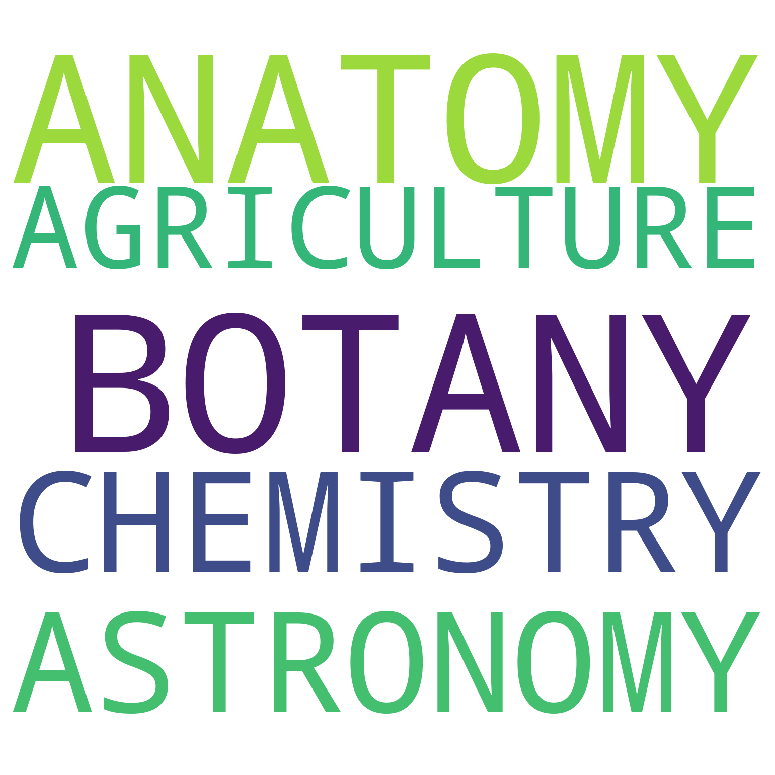

In [15]:
# Word cloud for evergreens
plt.figure(figsize=(10, 10), dpi= 100)
wordcloud = WordCloud(
                          background_color='white',
                          width=1500,
                          height=1500
                         ).generate(str(evergreensList.to_dict()).replace('\'',''))
plt.imshow(wordcloud)
plt.axis('off')

## Who are the meteors? (from Edition 6 to Edition 7)

Remember the question before?
- *In Edition 4-6, the connections of B-initial Related Words to Mother Words start with all letters show a dramatically rise. It seems like there were some new inclusive words appeared in that age. But when it comes to Edition 7, this pattern disappeared. Were those words gone?*

In [16]:
meteors = pd.DataFrame((RelatedWordFrequencies['Edition6']-RelatedWordFrequencies['Edition7']).dropna().sort_values(ascending=False)).rename(columns = {0:'Counts'}).head(10)
meteors

,Counts
BOTANY,885.0
ANATOMY,165.0
MEDICINE,85.0
ENTOMOLOGY,51.0
CHEMISTRY,38.0
LAW,35.0
SURGERY,30.0
ORNITHOLOGY,27.0
ICHTHYOLOGY,25.0
BARRIER,20.0


In [21]:
EditionName = RelatedWordFrequencies.columns.to_list()
for i in range(len(EditionName)):
    print('King References ',EditionName[i])
    pro = RelatedWordFrequencies[EditionName[i]]/RelatedWordFrequencies[EditionName[i]].sum()
#     kings = RelatedWordFrequencies[EditionName[i]].sort_values(ascending=False).head(3)
    print(pro.sort_values(ascending=False).head(3))

King References  Edition1
ANATOMY     0.075891
MEDICINE    0.041544
LAW         0.035983
Name: Edition1, dtype: float64
King References  Edition2
ANATOMY     0.049717
MEDICINE    0.018753
LAW         0.018317
Name: Edition2, dtype: float64
King References  Edition3
ANATOMY     0.058511
MEDICINE    0.017185
BOTANY      0.015957
Name: Edition3, dtype: float64
King References  Edition4
BOTANY      0.209829
ANATOMY     0.039749
MEDICINE    0.023368
Name: Edition4, dtype: float64
King References  Edition5
BOTANY      0.206754
ANATOMY     0.042274
MEDICINE    0.022838
Name: Edition5, dtype: float64
King References  Edition6
BOTANY        0.207469
ANATOMY       0.041494
SUPPLEMENT    0.023974
Name: Edition6, dtype: float64
King References  Edition7
ORNITHOLOGY    0.039278
MAMMAL         0.026539
MUSIC          0.020170
Name: Edition7, dtype: float64
King References  Edition8
BOTANY       0.024518
CHEMISTRY    0.023351
MUSIC        0.019848
Name: Edition8, dtype: float64


In [41]:
EditionName = RelatedWordFrequencies.columns.to_list()
for i in range(len(EditionName)-1):
    print('Meteors in ',EditionName[i+1])
    meteors = pd.DataFrame((RelatedWordFrequencies[EditionName[i]]-RelatedWordFrequencies[EditionName[i+1]]).dropna().sort_values(ascending=False)).rename(columns = {0:'Counts'}).head(3)
    print(meteors)

Meteors in  Edition2
          Counts
ANATOMY    118.0
MEDICINE    84.0
LAW         68.0
Meteors in  Edition3
           Counts
CHEMISTRY    22.0
ASTRONOMY    14.0
LAW          14.0
Meteors in  Edition4
              Counts
PHARMACY        12.0
ZOOLOGY          8.0
HYDROSTATICS     3.0
Meteors in  Edition5
             Counts
BOTANY         20.0
ICHTHYOLOGY     8.0
GRAMMAR         7.0
Meteors in  Edition6
              Counts
CHEMISTRY        8.0
BOTANY INDEX     4.0
MECHANICS        3.0
Meteors in  Edition7
          Counts
BOTANY     885.0
ANATOMY    165.0
MEDICINE    85.0
Meteors in  Edition8
             Counts
ORNITHOLOGY    20.0
MEDICINE        8.0
MAMMAL          7.0


(-0.5, 1499.5, 1499.5, -0.5)

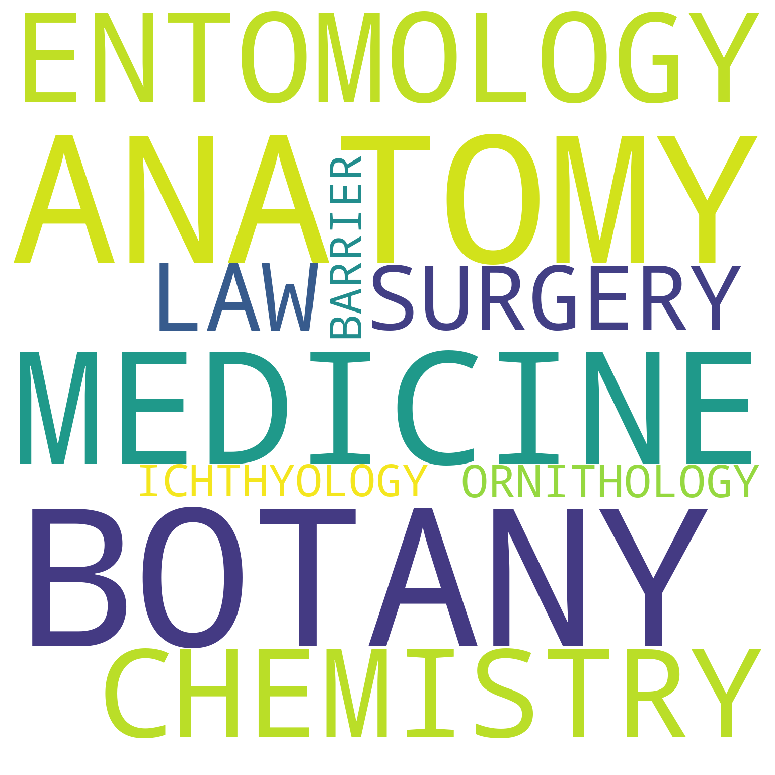

In [23]:
# Word cloud for meteors
plt.figure(figsize=(10, 10), dpi= 100)
wordcloud = WordCloud(
                          background_color='white',
                          width=1500,
                          height=1500
                         ).generate(str(meteors['Counts'].to_dict()).replace('\'',''))
plt.imshow(wordcloud)
plt.axis('off')



- So the answer is - yes, the word "Botany" missed, and the word "Anatomy" missed, too.

## In the end, some visualizations

(-0.5, 1499.5, 1499.5, -0.5)

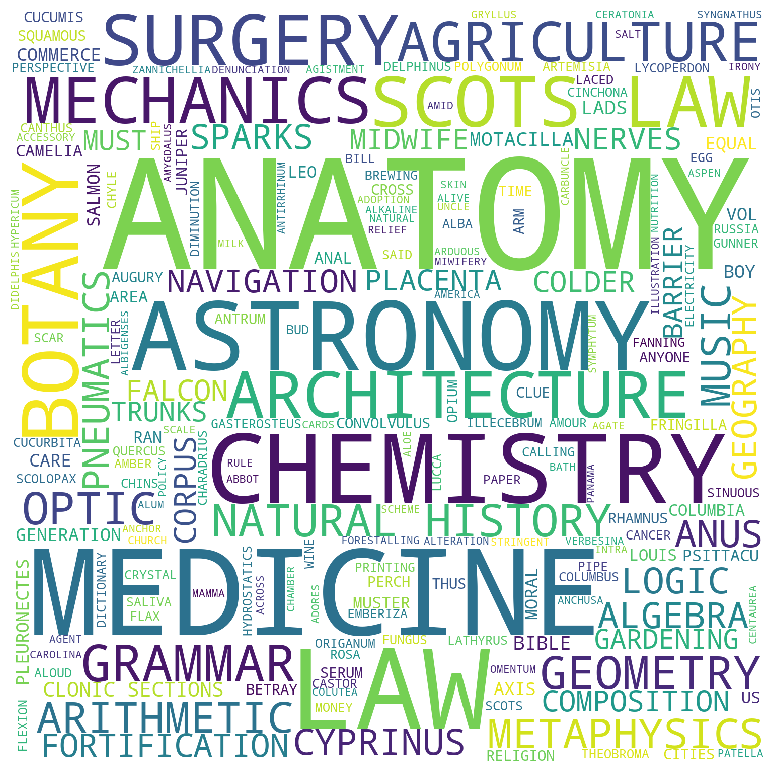

In [597]:
# Word cloud for related words in Edition 1, I can draw 8 similar graphs use this code
txtForWordcloud = ''
for relatedWord in allDataCleaned[allDataCleaned['Edition']==1]['RelatedWord']:
    txtForWordcloud = txtForWordcloud + ' ' + relatedWord
plt.figure(figsize=(10, 10), dpi= 100)
wordcloud = WordCloud(
                          background_color='white',
                          width=1500,
                          height=1500
                         ).generate(txtForWordcloud)
plt.imshow(wordcloud)
plt.axis('off')

In [23]:
RelatedWordFrequencies[RelatedWordFrequencies['Edition1']>100]

,Edition1,Edition2,Edition3,Edition4,Edition5,Edition6,Edition7,Edition8
ANATOMY,232.0,114.0,143.0,165.0,174.0,180.0,15.0,26.0
LAW,110.0,42.0,28.0,34.0,34.0,36.0,1.0,2.0
MEDICINE,127.0,43.0,42.0,97.0,94.0,94.0,9.0,1.0


Text(0.5, 1.0, 'Relational Map for Related Words in Edition1 whose connection number > 20')

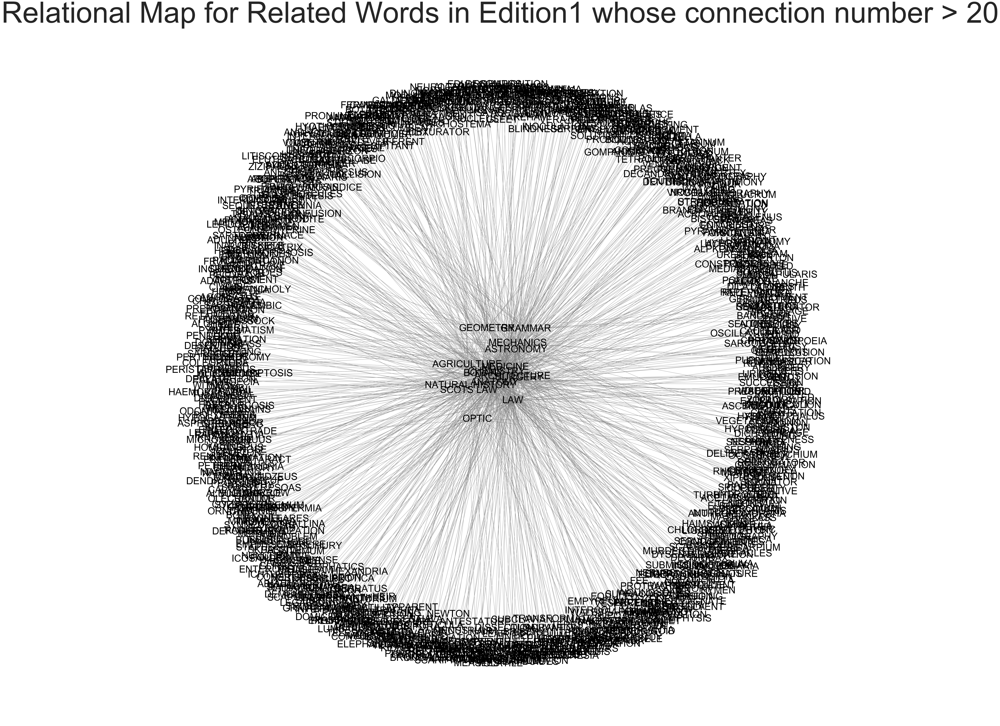

In [681]:
#A bad example of visualization, I will try to find a better way to visualize the relationship

plt.close()
plt.figure(figsize=(50, 50), dpi= 100)
cmap = sns.cubehelix_palette(dark=0, light=1, as_cmap=True)
GD = nx.DiGraph()
for word in RelatedWordFrequencies[RelatedWordFrequencies['Edition1']>20].index:
    #Add node
    GD.add_node(word)
    GD.add_nodes_from(allDataCleaned[(allDataCleaned['RelatedWord'] == word)&(allDataCleaned['Edition'] == 1)]['MotherWord'])
    for motherWord in allDataCleaned[(allDataCleaned['RelatedWord'] == word)&(allDataCleaned['Edition'] == 1)]['MotherWord']:
            GD.add_edge(word,motherWord)
nx.draw(GD,with_labels=True,node_size=50,node_color = 'white', node_shape ='s' ,edge_color = 'gray', font_color='black', font_size = 50)

plt.title('Relational Map for Related Words in Edition1 whose connection number > 20', fontdict = {'fontsize':150})

### Thank you for your time !

Reflection:
- The uncleaned textual data is really hard to analyse. To extract information from all the books, I spend too much time and I even didn't have enough time to come deeper into the data.
- However, I learned a lot from this intensive process. First, I learned how to analyse xml file and work with that. I found that xml is quite a good way to store some kind of data - it is structured. It can provide more information to me - although I didn't really use many of them(because of the bad quality of OCR). 
- Secondly, my visualization ability improved a lot. Now I am able to create interactive charts to better show the change over the whole time period.
- What I need to do in the future is: 1. Communicate with data holder and see what is a better direction for working on the data; 2. Work with my group members and have more effective collaborations; 3. Find better ways to visualize the relationships, and try to find some facts beyond the data - like history backgrounds, etc.

    